# Using deep Gaussian processes with GPflux for Bayesian optimization.

In [1]:
import numpy as np
import tensorflow as tf

For GPflux models we <strong>must</strong> use `tf.keras.backend.set_floatx()` to set the Keras backend float to the value consistent with GPflow (GPflow defaults to float64). Otherwise the code will crash with a ValueError!

In [2]:
np.random.seed(1794)
tf.random.set_seed(1794)
tf.keras.backend.set_floatx("float64")

## Describe the problem

In this notebook, we show how to use deep Gaussian processes (DGPs) for Bayesian optimization using Trieste and GPflux. DGPs may be better for modeling non-stationary objective functions than standard GP surrogates, as discussed in <cite data-cite="dutordoir2017deep,hebbal2019bayesian"/>.

In this example, we look to find the minimum value of the two- and five-dimensional [Michalewicz functions](https://www.sfu.ca/~ssurjano/michal.html) over the hypercubes $[0, pi]^2$/$[0, pi]^5$. We compare a two-layer DGP model with GPR, using Thompson sampling for both.

The Michalewicz functions are highly non-stationary and have a global minimum that's hard to find, so DGPs might be more suitable than standard GPs, which may struggle because they typically have stationary kernels that cannot easily model non-stationarities.

In [3]:
import gpflow
from trieste.objectives import (
    michalewicz_2,
    michalewicz_5,
    MICHALEWICZ_2_MINIMUM,
    MICHALEWICZ_5_MINIMUM,
    MICHALEWICZ_2_SEARCH_SPACE,
    MICHALEWICZ_5_SEARCH_SPACE
)
from trieste.objectives.utils import mk_observer
from util.plotting_plotly import plot_function_plotly

function = michalewicz_2
F_MINIMIZER = MICHALEWICZ_2_MINIMUM

search_space = MICHALEWICZ_2_SEARCH_SPACE

fig = plot_function_plotly(
    function,
    search_space.lower,
    search_space.upper,
    grid_density=100
)
fig.update_layout(height=800, width=800)
fig.show()

## Sample the observer over the search space

We set up the observer as usual, using Sobol sampling to sample the initial points.

In [4]:
import trieste

observer = mk_observer(function)

num_initial_points = 20
num_steps = 20
initial_query_points = search_space.sample_sobol(num_initial_points)
initial_data = observer(initial_query_points)

## Model the objective function

The Bayesian optimization procedure estimates the next best points to query by using a probabilistic model of the objective. We'll use a two layer deep Gaussian process (DGP), built using GPflux. We also compare to a (shallow) GP.

Since DGPs can be hard to build, Trieste provides some basic architectures: here we use the `build_vanilla_deep_gp` function which returns a GPflux model of `DeepGP` class. As with other models (e.g. GPflow), we cannot use it directly in Bayesian optimization routines, we need to pass it through an appropriate wrapper, `DeepGaussianProcess` wrapper in this case.

Few other useful notes regarding building a DGP model. The DGP model requires us to specify the number of inducing points, as we don't have the true posterior. To train the model we have to use a stochastic optimizer; Adam is used by default, but we can use other stochastic optimizers from TensorFlow. GPflux allows us to use the Keras `fit` method, which makes optimizing a lot easier - this method is used in the background for training the model. For this problem we need to modify the default optimizer settings slightly, so we initialize a new optimizer wrapper instance (`Optimizer`) with custom minimization arguments `minimize_args` which are passed to Keras' `fit` method (check [Keras API documentation](https://keras.io/api/models/model_training_apis/#fit-method) for a list of possible arguments).

In [5]:
from gpflow.utilities import set_trainable

from trieste.models.gpflux import DeepGaussianProcess, build_vanilla_deep_gp
from trieste.models.optimizer import Optimizer


def build_dgp_model(data):
    variance = tf.math.reduce_variance(data.observations)

    dgp = build_vanilla_deep_gp(data.query_points, num_layers=2, num_inducing=100)
    dgp.f_layers[-1].kernel.kernel.variance.assign(variance)
    dgp.f_layers[-1].mean_function = gpflow.mean_functions.Constant()
    dgp.likelihood_layer.likelihood.variance.assign(1e-5)
    set_trainable(dgp.likelihood_layer.likelihood.variance, False)

    # These are just arguments for the Keras `fit` method.
    minimize_args = {
        "batch_size": 100,
        "epochs": 200,
        "verbose": 0,
    }
    optimizer = Optimizer(tf.optimizers.Adam(0.01), minimize_args)

    return DeepGaussianProcess(model=dgp, optimizer=optimizer)


dgp_model = build_dgp_model(initial_data)

Instructions for updating:
`scale_identity_multiplier` is deprecated; please combine it into `scale_diag` directly instead.


## Run the optimization loop

We can now run the Bayesian optimization loop by defining a `BayesianOptimizer` and calling its `optimize` method.

The optimizer uses an acquisition rule to choose where in the search space to try on each optimization step. We'll start by using Thompson sampling.

We'll run the optimizer for twenty steps. Note: this may take a while!

In [6]:
from trieste.acquisition.rule import DiscreteThompsonSampling

bo = trieste.bayesian_optimizer.BayesianOptimizer(observer, search_space)
grid_size = 1000
acquisition_rule = DiscreteThompsonSampling(grid_size, 1)

# Note that the GPflux interface does not currently support using `track_state=True`. This will be
# addressed in a future update.
dgp_result = bo.optimize(num_steps, initial_data, dgp_model,
                         acquisition_rule=acquisition_rule, track_state=False)
dgp_dataset = dgp_result.try_get_final_dataset()

Optimization completed without errors


## Explore the results

We can now get the best point found by the optimizer. Note this isn't necessarily the point that was last evaluated.

In [7]:
dgp_query_points = dgp_dataset.query_points.numpy()
dgp_observations = dgp_dataset.observations.numpy()

dgp_arg_min_idx = tf.squeeze(tf.argmin(dgp_observations, axis=0))

print(f"query point: {dgp_query_points[dgp_arg_min_idx, :]}")
print(f"observation: {dgp_observations[dgp_arg_min_idx, :]}")

query point: [2.18908725 1.56658573]
observation: [-1.79750852]


We can visualise how the optimizer performed as a three-dimensional plot

In [8]:
from util.plotting_plotly import add_bo_points_plotly

fig = plot_function_plotly(function, search_space.lower, search_space.upper, grid_density=100)
fig.update_layout(height=800, width=800)

fig = add_bo_points_plotly(
    x=dgp_query_points[:, 0],
    y=dgp_query_points[:, 1],
    z=dgp_observations[:, 0],
    num_init=num_initial_points,
    idx_best=dgp_arg_min_idx,
    fig=fig,
)
fig.show()

We can visualise the model over the objective function by plotting the mean and 95% confidence intervals of its predictive distribution. Note that the DGP model is able to model the local structure of the true objective function.

In [9]:
import matplotlib.pyplot as plt
from util.plotting import plot_regret
from util.plotting_plotly import plot_dgp_plotly

fig = plot_dgp_plotly(
    dgp_result.try_get_final_model().model_gpflux,  # type: ignore
    search_space.lower,
    search_space.upper,
    grid_density=100,
)

fig = add_bo_points_plotly(
    x=dgp_query_points[:, 0],
    y=dgp_query_points[:, 1],
    z=dgp_observations[:, 0],
    num_init=num_initial_points,
    idx_best=dgp_arg_min_idx,
    fig=fig,
    figrow=1,
    figcol=1,
)
fig.update_layout(height=800, width=800)
fig.show()

We now compare to a GP model with priors over the hyperparameters. We do not expect this to do as well because GP models cannot deal with non-stationary functions well.

In [10]:
import gpflow
import tensorflow_probability as tfp

from trieste.models.gpflow import GaussianProcessRegression


def build_gp_model(data):
    variance = tf.math.reduce_variance(data.observations)
    kernel = gpflow.kernels.Matern52(variance=variance, lengthscales=[0.2]*data.query_points.shape[-1])
    prior_scale = tf.cast(1.0, dtype=tf.float64)
    kernel.variance.prior = tfp.distributions.LogNormal(tf.cast(-2.0, dtype=tf.float64), prior_scale)
    kernel.lengthscales.prior = tfp.distributions.LogNormal(tf.math.log(kernel.lengthscales), prior_scale)
    gpr = gpflow.models.GPR(data.astuple(), kernel, mean_function=gpflow.mean_functions.Constant(), noise_variance=1e-5)
    gpflow.set_trainable(gpr.likelihood, False)
    num_kernel_samples = 100

    return GaussianProcessRegression(gpr)


gp_model = build_gp_model(initial_data)

bo = trieste.bayesian_optimizer.BayesianOptimizer(observer, search_space)

result = bo.optimize(num_steps, initial_data, gp_model, acquisition_rule=acquisition_rule,
                     track_state=False)
gp_dataset = result.try_get_final_dataset()

gp_query_points = gp_dataset.query_points.numpy()
gp_observations = gp_dataset.observations.numpy()

gp_arg_min_idx = tf.squeeze(tf.argmin(gp_observations, axis=0))

print(f"query point: {gp_query_points[gp_arg_min_idx, :]}")
print(f"observation: {gp_observations[gp_arg_min_idx, :]}")

from util.plotting_plotly import plot_gp_plotly

fig = plot_gp_plotly(
    result.try_get_final_model().model,  # type: ignore
    search_space.lower,
    search_space.upper,
    grid_density=100,
)

fig = add_bo_points_plotly(
    x=gp_query_points[:, 0],
    y=gp_query_points[:, 1],
    z=gp_observations[:, 0],
    num_init=num_initial_points,
    idx_best=gp_arg_min_idx,
    fig=fig,
    figrow=1,
    figcol=1,
)
fig.update_layout(height=800, width=800)
fig.show()

Optimization completed without errors


query point: [2.54378408 1.5652403 ]
observation: [-1.04530869]


We see that the DGP model does a much better job at understanding the structure of the function. The standard Gaussian process model has a large signal variance and small lengthscales, which do not result in a good model of the true objective. On the other hand, the DGP model is at least able to infer the local structure around the observations.

We can also plot the regret curves of the two models side-by-side.

Text(0.5, 0, '# evaluations')

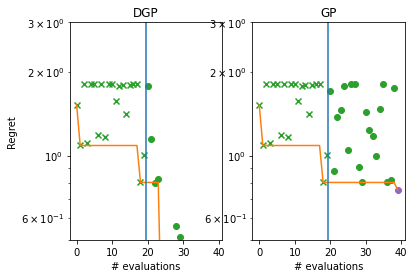

In [11]:

gp_suboptimality = gp_observations - F_MINIMIZER.numpy()
dgp_suboptimality = dgp_observations - F_MINIMIZER.numpy()

_, ax = plt.subplots(1, 2)
plot_regret(dgp_suboptimality, ax[0], num_init=num_initial_points, idx_best=dgp_arg_min_idx)
plot_regret(gp_suboptimality, ax[1], num_init=num_initial_points, idx_best=gp_arg_min_idx)

ax[0].set_yscale("log")
ax[0].set_ylabel("Regret")
ax[0].set_ylim(0.5, 3)
ax[0].set_xlabel("# evaluations")
ax[0].set_title("DGP")

ax[1].set_title("GP")
ax[1].set_yscale("log")
ax[1].set_ylim(0.5, 3)
ax[1].set_xlabel("# evaluations")

We might also expect that the DGP model will do better on higher dimensional data. We explore this by testing a higher-dimensional version of the Michalewicz dataset.

Set up the problem.

In [12]:

function = michalewicz_5
F_MINIMIZER = MICHALEWICZ_5_MINIMUM

search_space = MICHALEWICZ_5_SEARCH_SPACE

observer = mk_observer(function)

num_initial_points = 50
num_steps = 50
initial_query_points = search_space.sample_sobol(num_initial_points)
initial_data = observer(initial_query_points)

Build the DGP model and run the Bayes opt loop.

In [13]:

dgp_model = build_dgp_model(initial_data)

bo = trieste.bayesian_optimizer.BayesianOptimizer(observer, search_space)
acquisition_rule = DiscreteThompsonSampling(grid_size, 1)

dgp_result = bo.optimize(num_steps, initial_data, dgp_model,
                         acquisition_rule=acquisition_rule, track_state=False)
dgp_dataset = dgp_result.try_get_final_dataset()

dgp_query_points = dgp_dataset.query_points.numpy()
dgp_observations = dgp_dataset.observations.numpy()

dgp_arg_min_idx = tf.squeeze(tf.argmin(dgp_observations, axis=0))

print(f"query point: {dgp_query_points[dgp_arg_min_idx, :]}")
print(f"observation: {dgp_observations[dgp_arg_min_idx, :]}")

dgp_suboptimality = dgp_observations - F_MINIMIZER.numpy()

Optimization completed without errors


query point: [2.18519298 2.44722265 1.29701476 2.46369582 0.09738709]
observation: [-2.28221713]


Repeat the above for the GP model.

In [14]:

gp_model = build_gp_model(initial_data)

bo = trieste.bayesian_optimizer.BayesianOptimizer(observer, search_space)

result = bo.optimize(num_steps, initial_data, gp_model, acquisition_rule=acquisition_rule,
                     track_state=False)
gp_dataset = result.try_get_final_dataset()

gp_query_points = gp_dataset.query_points.numpy()
gp_observations = gp_dataset.observations.numpy()

gp_arg_min_idx = tf.squeeze(tf.argmin(gp_observations, axis=0))

print(f"query point: {gp_query_points[gp_arg_min_idx, :]}")
print(f"observation: {gp_observations[gp_arg_min_idx, :]}")

gp_suboptimality = gp_observations - F_MINIMIZER.numpy()

Optimization completed without errors


query point: [2.28136499 2.73015024 1.46068527 2.48097424 0.18700185]
observation: [-1.81509633]


Plot the regret.

Text(0.5, 0, '# evaluations')

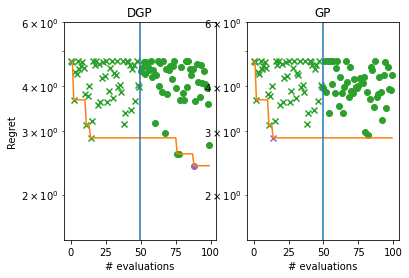

In [15]:

_, ax = plt.subplots(1, 2)
plot_regret(dgp_suboptimality, ax[0], num_init=num_initial_points, idx_best=dgp_arg_min_idx)
plot_regret(gp_suboptimality, ax[1], num_init=num_initial_points, idx_best=gp_arg_min_idx)

ax[0].set_yscale("log")
ax[0].set_ylabel("Regret")
ax[0].set_ylim(1.5, 6)
ax[0].set_xlabel("# evaluations")
ax[0].set_title("DGP")

ax[1].set_title("GP")
ax[1].set_yscale("log")
ax[1].set_ylim(1.5, 6)
ax[1].set_xlabel("# evaluations")

While still far from the optimum, it is considerably better than the GP.

## LICENSE

[Apache License 2.0](https://github.com/secondmind-labs/trieste/blob/develop/LICENSE)